# Loading Dataset
---

dataset source: https://www.kaggle.com/datasets/marklvl/bike-sharing-dataset

In [1]:
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv('day.csv', parse_dates=['dteday'])
df.drop(columns='instant', inplace=True)
df

,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,2012-12-27,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114
727,2012-12-28,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095
728,2012-12-29,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341
729,2012-12-30,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796


---
---
## Column Dictionary
---

|Column|Definition|
|---|---|
|`dteday`|Date of the record|
|`season`|Season, with 1: 'spring', 2: 'summer', 3: 'fall', 4: 'winter'|
|`yr`|Year, with 0: 2011, 1: 2012|
|`mnth`|Month, self-explanatory|
|`holiday`|Whether day was holiday or not|
|`weekday`|Day of the week, 0: 'Sunday'|
|`workingday`|If neither weekend or holiday coded 1, otherwise 0|
|`weathersit`|1:'clear', 2:'mist, no rain', 3:'rain/snow', 4:'rain/snow with limited visibility'|
|`temp`|Normalized temperature in Celsius, with min = -8 and max = +39|
|`atemp`|Normalized feeling temperature in Celsius, with min = -16, max = +50|
|`hum`|Normalized humidity|
|`windspeed`|Normalized wind speed, with maximum is 67 knots|
|`casual`|Count of casual users|
|`registered`|Count of registered users|
|`cnt`|Total rental bikes|

---
---
# Exploratory Data Analysis
---

## Checking Data Types
___

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   dteday      731 non-null    datetime64[ns]
 1   season      731 non-null    int64         
 2   yr          731 non-null    int64         
 3   mnth        731 non-null    int64         
 4   holiday     731 non-null    int64         
 5   weekday     731 non-null    int64         
 6   workingday  731 non-null    int64         
 7   weathersit  731 non-null    int64         
 8   temp        731 non-null    float64       
 9   atemp       731 non-null    float64       
 10  hum         731 non-null    float64       
 11  windspeed   731 non-null    float64       
 12  casual      731 non-null    int64         
 13  registered  731 non-null    int64         
 14  cnt         731 non-null    int64         
dtypes: datetime64[ns](1), float64(4), int64(10)
memory usage: 85.8 KB


In [4]:
# Change data types to be more proper

df[['season', 'holiday', 'workingday', 'weathersit']] = df[['season', 'holiday', 'workingday', 'weathersit']].astype(object)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   dteday      731 non-null    datetime64[ns]
 1   season      731 non-null    object        
 2   yr          731 non-null    int64         
 3   mnth        731 non-null    int64         
 4   holiday     731 non-null    object        
 5   weekday     731 non-null    int64         
 6   workingday  731 non-null    object        
 7   weathersit  731 non-null    object        
 8   temp        731 non-null    float64       
 9   atemp       731 non-null    float64       
 10  hum         731 non-null    float64       
 11  windspeed   731 non-null    float64       
 12  casual      731 non-null    int64         
 13  registered  731 non-null    int64         
 14  cnt         731 non-null    int64         
dtypes: datetime64[ns](1), float64(4), int64(6), object(4)
memory usage: 85.8+ 

---
---
## Exploring Raw Data
---

In [5]:
# import ydata-profiling

from ydata_profiling import ProfileReport

report = ProfileReport(df, title= 'Capital Bikeshare Rental Data 2011 - 2012')
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

There were several things needed to be checked further:
* Outliers in `hum`
* Outliers in `windspeed`

---
---
## Cleaning Data
---

### Outliers in `hum`

In [6]:
df[df['hum']<0.4]

,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
44,2011-02-14,1,0,2,0,1,1,1,0.415000,0.398350,0.375833,0.417908,208,1705,1913
45,2011-02-15,1,0,2,0,2,1,1,0.266087,0.254274,0.314348,0.291374,140,1675,1815
49,2011-02-19,1,0,2,0,6,0,1,0.399167,0.391404,0.187917,0.507463,532,1103,1635
61,2011-03-03,1,0,3,0,4,1,1,0.198333,0.200133,0.318333,0.225754,123,1562,1685
68,2011-03-10,1,0,3,0,4,1,3,0.389091,0.385668,0.000000,0.261877,46,577,623
77,2011-03-19,1,0,3,0,6,0,1,0.472500,0.466525,0.379167,0.368167,1424,1693,3117
84,2011-03-26,2,0,3,0,6,0,1,0.265833,0.257571,0.394167,0.209571,981,1515,2496
86,2011-03-28,2,0,3,0,1,1,1,0.264348,0.257574,0.302174,0.212204,222,1806,2028
87,2011-03-29,2,0,3,0,2,1,1,0.302500,0.292908,0.314167,0.226996,317,2108,2425
152,2011-06-02,2,0,6,0,4,1,1,0.715000,0.643942,0.305000,0.292287,736,4232,4968


There's a zero value in `hum`, while the `weathersit` was 3 in 2011-03-10. However, from the common sense, rain should increase humidity , while snow more likely would not happen in March. After checking from [Weather Underground](https://www.wunderground.com/history/daily/us/va/arlington/KDCA/date/2011-3-10), it was concluded that the zero value humidity was a misinput from the system. The humidity will be inputted with KNN in feature engineering process.

### Outliers in `windspeed`

In [7]:
df[(df['windspeed']<0.1) | (df['windspeed']>0.4)].sort_values('windspeed')

,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
279,2011-10-07,4,0,10,0,5,1,1,0.510833,0.504404,0.684167,0.022392,949,4036,4985
282,2011-10-10,4,0,10,1,1,0,1,0.570833,0.542925,0.733750,0.042304,1514,3603,5117
280,2011-10-08,4,0,10,0,6,0,1,0.521667,0.513242,0.701250,0.045404,2235,3174,5409
37,2011-02-07,1,0,2,0,1,1,1,0.271667,0.303658,0.738333,0.045408,120,1592,1712
695,2012-11-26,4,1,11,0,1,1,1,0.313333,0.339004,0.535417,0.046650,337,4750,5087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44,2011-02-14,1,0,2,0,1,1,1,0.415000,0.398350,0.375833,0.417908,208,1705,1913
420,2012-02-25,1,1,2,0,6,0,1,0.290833,0.255675,0.395833,0.421642,317,2415,2732
292,2011-10-20,4,0,10,0,4,1,1,0.475833,0.466525,0.636250,0.422275,471,3724,4195
432,2012-03-08,1,1,3,0,4,1,1,0.527500,0.524604,0.567500,0.441563,486,4896,5382


After checking, it was concluded that there was nothing wrong with the data.

---
---
## Dropping irrelevant columns
---

In [8]:
df_drop = df.drop(columns=['yr', 'mnth', 'weekday', 'season','holiday','atemp', 'casual', 'registered'])
df_drop

,dteday,workingday,weathersit,temp,hum,windspeed,cnt
0,2011-01-01,0,2,0.344167,0.805833,0.160446,985
1,2011-01-02,0,2,0.363478,0.696087,0.248539,801
2,2011-01-03,1,1,0.196364,0.437273,0.248309,1349
3,2011-01-04,1,1,0.200000,0.590435,0.160296,1562
4,2011-01-05,1,1,0.226957,0.436957,0.186900,1600
...,...,...,...,...,...,...,...
726,2012-12-27,1,2,0.254167,0.652917,0.350133,2114
727,2012-12-28,1,2,0.253333,0.590000,0.155471,3095
728,2012-12-29,0,2,0.253333,0.752917,0.124383,1341
729,2012-12-30,0,1,0.255833,0.483333,0.350754,1796


In [9]:
# creating time-based columns

df_drop['year'] = df_drop['dteday'].dt.year
df_drop['month'] = df_drop['dteday'].dt.month.astype('object')
df_drop['day'] = df_drop['dteday'].dt.day.astype('object')

df_drop = df_drop[['dteday', 'year', 'month', 'day', 'workingday', 'weathersit', 'temp', 'hum',
       'windspeed', 'cnt']]
df_drop

,dteday,year,month,day,workingday,weathersit,temp,hum,windspeed,cnt
0,2011-01-01,2011,1,1,0,2,0.344167,0.805833,0.160446,985
1,2011-01-02,2011,1,2,0,2,0.363478,0.696087,0.248539,801
2,2011-01-03,2011,1,3,1,1,0.196364,0.437273,0.248309,1349
3,2011-01-04,2011,1,4,1,1,0.200000,0.590435,0.160296,1562
4,2011-01-05,2011,1,5,1,1,0.226957,0.436957,0.186900,1600
...,...,...,...,...,...,...,...,...,...,...
726,2012-12-27,2012,12,27,1,2,0.254167,0.652917,0.350133,2114
727,2012-12-28,2012,12,28,1,2,0.253333,0.590000,0.155471,3095
728,2012-12-29,2012,12,29,0,2,0.253333,0.752917,0.124383,1341
729,2012-12-30,2012,12,30,0,1,0.255833,0.483333,0.350754,1796


In [10]:
df_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   dteday      731 non-null    datetime64[ns]
 1   year        731 non-null    int32         
 2   month       731 non-null    object        
 3   day         731 non-null    object        
 4   workingday  731 non-null    object        
 5   weathersit  731 non-null    object        
 6   temp        731 non-null    float64       
 7   hum         731 non-null    float64       
 8   windspeed   731 non-null    float64       
 9   cnt         731 non-null    int64         
dtypes: datetime64[ns](1), float64(3), int32(1), int64(1), object(4)
memory usage: 54.4+ KB


---
---
## Deeper Analysis
---

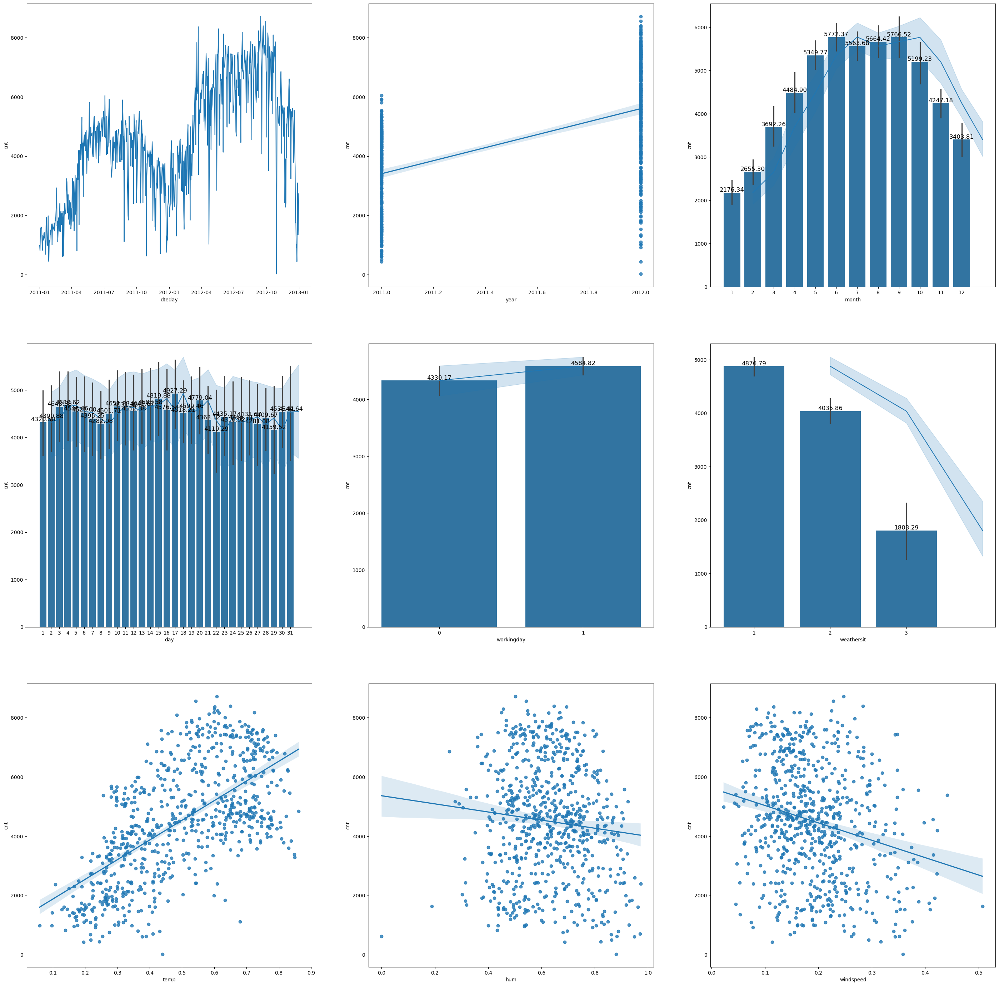

In [11]:
# plotting figure
fig, axes = plt.subplots(nrows=3, ncols=3, figsize = (35,35))
axes = axes.flatten()

# Setting up visualization

for index, columns in enumerate(df_drop.drop(columns='cnt').columns):
    if columns in df_drop.select_dtypes('object').columns:
        plot = sns.barplot(data=df_drop, x = columns, y='cnt',ax= axes[index])
        for p in plot.patches:
            height = p.get_height()
            plot.annotate(f'{height:.2f}',  # Format the number to 2 decimal places
                        (p.get_x() + p.get_width() / 2., height),  # Position of the text
                ha='center', va='bottom', fontsize=12, color='black')  # Text alignment and style
    if columns in df_drop.select_dtypes('number').columns:
        sns.regplot(data=df_drop, x = columns, y='cnt', ax=axes[index])
    else:
        sns.lineplot(data=df_drop, x = columns, y ='cnt', ax=axes[index])
plt.show()

both not normal, so using mann-whitney

---
---
## Analyzing Seasonality
---

In [12]:
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

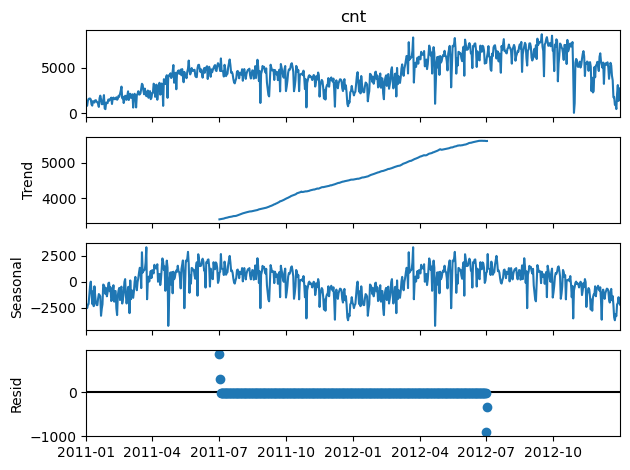

In [13]:
series = df_drop.copy()
series = df.set_index(['dteday'])['cnt']
result = seasonal_decompose(series, model='additive', period = 365)
result.plot()
plt.show()

It can be seen that there was growth for the number of bike rented overtime, indicating positive news for the firm.

In [14]:
# checking stationarity

from statsmodels.tsa.stattools import adfuller
adf = adfuller(series)
print(adf)

alpha = 0.05
if adf[1] <= alpha:
    print('Reject null hypothesis, The data is stationary')
else:
    print('Failed to reject null hypothesis, The data is not stationary')

(-1.8774481444374298, 0.34274344033921944, 13, 717, {'1%': -3.439503230053971, '5%': -2.8655794463678346, '10%': -2.5689210707289982}, 11740.390931163352)
Failed to reject null hypothesis, The data is not stationary


---
---
# Machine Learning Model - Using Basic Algorithm
---

In [15]:
# Importing libraries

from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score, RandomizedSearchCV, KFold, GridSearchCV

import category_encoders as ce
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import KNNImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

import pmdarima as pmd
from statsmodels.tsa.arima.model import ARIMA

---
---
## Splitting the Data
---

In [16]:
# Splitting based on Dates

time_train = df_drop[df_drop['dteday']<'2012-10-01']
time_test = df_drop[df_drop['dteday']>='2012-10-01']

X_train = time_train[[ 'year', 'month', 'day', 'workingday', 'weathersit', 'temp', 'hum', 'windspeed']]
y_train = time_train['cnt']

X_test = time_test[[ 'year', 'month', 'day', 'workingday', 'weathersit', 'temp', 'hum', 'windspeed']]
y_test = time_test['cnt']


---
---
## Feature Engineering
---

Feature Engineering to be done in this notebook:
* Encoding:
    - One Hot Encoding:`weathersit`
    - Binary Encoding: `month`, `day`
* KNN Imputer: `hum` of 0 values

Not using scaling since the relevant features were normalized

In [17]:
# Setting up column transformer

transformer = ColumnTransformer([
    ('OH_encode', OneHotEncoder(drop='first', handle_unknown='ignore'), ['weathersit']),
    ('Bi_encode', ce.BinaryEncoder(), ['month', 'day']),
    ('impute', KNNImputer(missing_values=0), ['hum'])
], remainder='passthrough')

---
---
## Cross-Validating
---

In [18]:
# Model List

lr = LinearRegression()
l2 = Ridge(random_state=47)
l1 = Lasso(random_state=47)
knn = KNeighborsRegressor()
svr = SVR()
en = ElasticNet(random_state=47)

models = [lr, l2, l1, knn, svr, en]

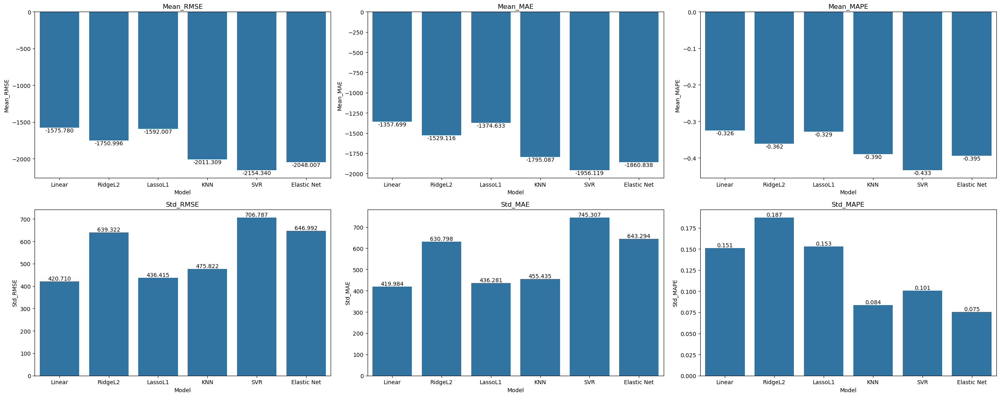

In [19]:
# Metric Score
score_rmse = []
nilai_mean_rmse = []
nilai_std_rmse = []

score_mae = []
nilai_mean_mae = []
nilai_std_mae = []

score_mape = []
nilai_mean_mape = []
nilai_std_mape = []


# Cross-Validating

for model in models:
    crossval = TimeSeriesSplit(n_splits=7)
    estimator = Pipeline([
        ('transform', transformer),
        ('model', model)
    ])

    # RMSE
    model_cv_rmse = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_root_mean_squared_error', 
        error_score='raise'
        )
    score_rmse.append(model_cv_rmse)
    nilai_mean_rmse.append(model_cv_rmse.mean())
    nilai_std_rmse.append(model_cv_rmse.std())

    # MAE
    model_cv_mae = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_mean_absolute_error', 
        error_score='raise'
        )
    score_mae.append(model_cv_mae)
    nilai_mean_mae.append(model_cv_mae.mean())
    nilai_std_mae.append(model_cv_mae.std())

    # MAPE
    model_cv_mape = cross_val_score(
        estimator, 
        X_train, 
        y_train,
        cv=crossval, 
        scoring='neg_mean_absolute_percentage_error', 
        error_score='raise'
        )
    score_mape.append(model_cv_mape)
    nilai_mean_mape.append(model_cv_mape.mean())
    nilai_std_mape.append(model_cv_mape.std())


# Evaluasi model untuk digunakan sebagai benchmark

eval_scale_time = pd.DataFrame({
    'Model':['Linear', 'RidgeL2', 'LassoL1', 'KNN', 'SVR', 'Elastic Net'],
    'Mean_RMSE': nilai_mean_rmse,
    'Std_RMSE': nilai_std_rmse,
    'Mean_MAE': nilai_mean_mae,
    'Std_MAE': nilai_std_mae,
    'Mean_MAPE': nilai_mean_mape,
    'Std_MAPE': nilai_std_mape
})

plt.figure(figsize = (25,10))
for i, j in enumerate(eval_scale_time.drop(columns = 'Model').columns):
    if i % 2 == 0:
        plt.subplot(2, 3, int((i+2)/2))
        ax = sns.barplot(data = eval_scale_time, x = 'Model', y = j, )
        plt.title(j)
    else:
        plt.subplot(2, 3, int((i+7)/2))
        ax = sns.barplot(data = eval_scale_time, x = 'Model', y = j, )
        plt.title(j)
    for container in ax.containers:
            ax.bar_label(container, label_type='edge', fmt='%.3f', )
plt.tight_layout()
plt.show()

---
---
## Testing Base Model (Linear Regression)
---

In [20]:
# Prediksi menggunakan model benchmark

def benchmark_model(reg_model, nama_model):
    estimator = Pipeline([
        ('preprocess', transformer),
        ('reg_model', reg_model)
    ])
    regressor = estimator.fit(X_train, y_train)
    y_pred = regressor.predict(X_test)
    skor_rmse = []
    skor_mae = []
    skor_mape = []
    skor_rmse.append(np.sqrt(mean_squared_error(y_test, y_pred)))
    skor_mae.append(mean_absolute_error(y_test, y_pred))
    skor_mape.append(mean_absolute_percentage_error(y_test, y_pred))
    skor_before_tuning = pd.DataFrame({'RMSE': skor_rmse, 'MAE': skor_mae, 'MAPE': skor_mape}, index = [nama_model])
    return skor_before_tuning

In [21]:
benchmark_model(lr, 'Linear Regression')

,RMSE,MAE,MAPE
Linear Regression,1598.996738,1157.194009,2.232757


---
---
## Hyperparameter Tuning
---

In [22]:
model = lr

estimator = Pipeline([
        ('preprocess', transformer),
        ('reg_model', model)
    ])

param_grid = {
    'reg_model__fit_intercept': [True, False],
    'reg_model__n_jobs': [-1],
    'reg_model__positive': [True, False],
}


crossval = TimeSeriesSplit(n_splits=7)

In [23]:
# Grid Search

grid = GridSearchCV(
    estimator,
    param_grid= param_grid,
    cv = crossval,
    scoring = ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs = -1,
    refit = 'neg_mean_absolute_percentage_error', # Hanya bisa memilih salah stau metric untuk optimisasi
)

In [24]:
grid.fit(X_train, y_train)

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=7, test_size=None),
             estimator=Pipeline(steps=[('preprocess',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('OH_encode',
                                                                         OneHotEncoder(drop='first',
                                                                                       handle_unknown='ignore'),
                                                                         ['weathersit']),
                                                                        ('Bi_encode',
                                                                         BinaryEncoder(),
                                                                         ['month',
                                                                          'day']),
                                                                        ('impute',
                                                                         KNNImputer(missing_values=0),
                                                                         ['hum'])])),
                                       ('reg_model', LinearRegression())]),
             n_jobs=-1,
             param_grid={'reg_model__fit_intercept': [True, False],
                         'reg_model__n_jobs': [-1],
                         'reg_model__positive': [True, False]},
             refit='neg_mean_absolute_percentage_error',
             scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error',
                      'neg_mean_absolute_percentage_error'])

In [25]:
# Mengecek skor dan paramater terbaik
print('Decision Tree Regressor')
print('Best_score:', grid.best_score_)
print('Best_params:', grid.best_params_)

Decision Tree Regressor
Best_score: -0.32557231401408204
Best_params: {'reg_model__fit_intercept': True, 'reg_model__n_jobs': -1, 'reg_model__positive': False}


---
---
## Final Model Result
---

In [26]:
benchmark_model(lr, 'Linear Regression - Base Regressor')

,RMSE,MAE,MAPE
Linear Regression - Base Regressor,1598.996738,1157.194009,2.232757


In [27]:
# Fitting best estimator

best_lr = grid.best_estimator_
best_lr.fit(X_train, y_train)

# Predicting test set
y_pred = best_lr.predict(X_test)

# Menyimpan nilai metrik RMSE, MAE, dan MAPE
rmse_best = np.sqrt(mean_squared_error(y_test, y_pred))
mae_best = mean_absolute_error(y_test, y_pred)
mape_best = mean_absolute_percentage_error(y_test, y_pred)

finalLR = pd.DataFrame({'RMSE': rmse_best, 'MAE': mae_best, 'MAPE': mape_best}, index = ['Linear Regression - Tuned'])
finalLR

,RMSE,MAE,MAPE
Linear Regression - Tuned,1598.996738,1157.194009,2.232757


### Error Distribution

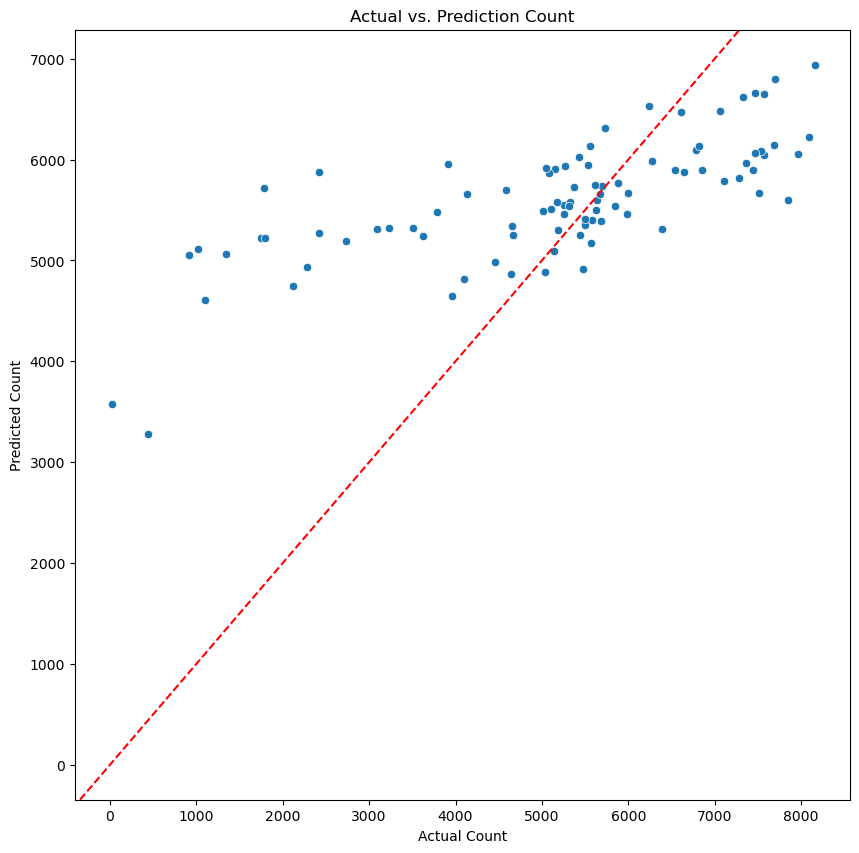

In [28]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x=y_test, y=y_pred).set(title='Actual vs. Prediction Count', 
                                               xlabel='Actual Count', 
                                               ylabel='Predicted Count')
plt.axline((0,0),slope=1, color='red', linestyle='--')
plt.show()

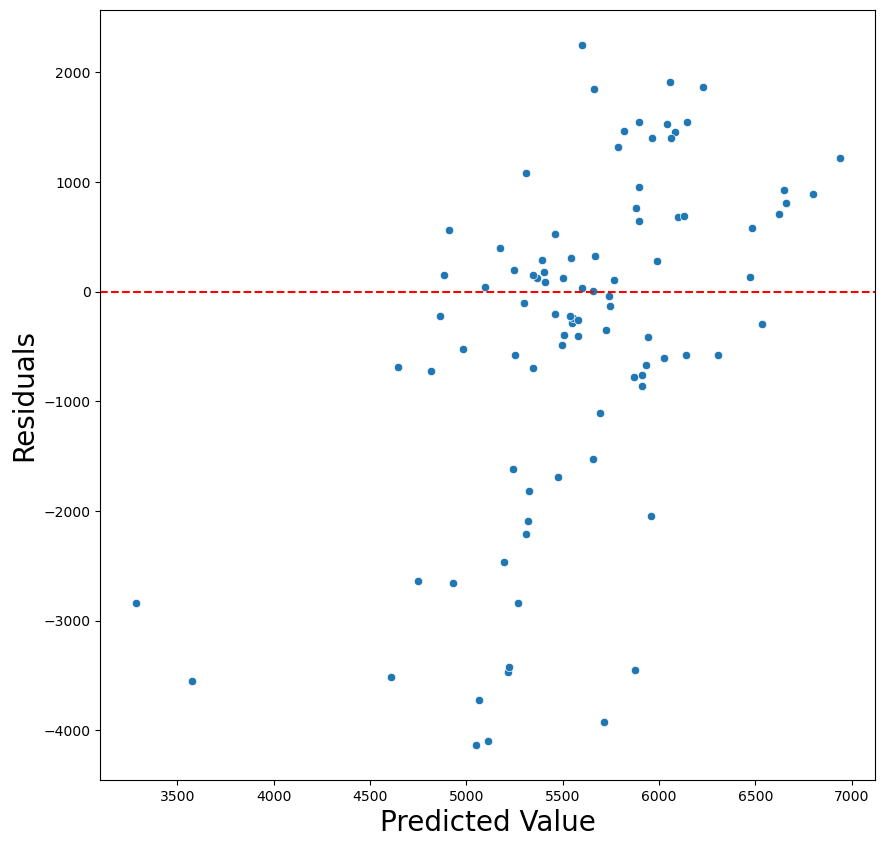

In [29]:
residual = (y_test - y_pred)

plt.figure(figsize=(10,10))
sns.scatterplot(x = y_pred, y = residual)
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Value', fontsize = 20)
plt.ylabel('Residuals', fontsize = 20)
plt.show()

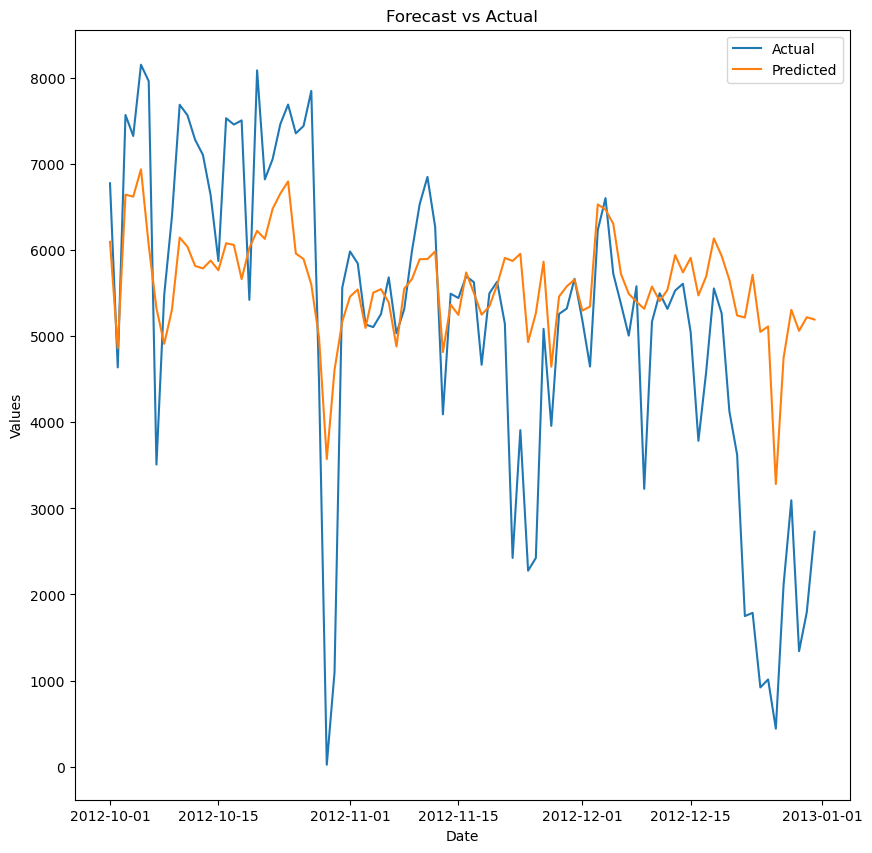

In [30]:
plt.figure(figsize=(10,10))
plt.plot(time_test['dteday'], y_test, label = 'Actual')
plt.plot(time_test['dteday'], y_pred, label = 'Predicted')
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()

This bad results shows that the model cannot handle few sample sizes and it might be too complex to solve using basic models

---
---
# Machine Learning Model - Using Prophet
---

To use Prophet, there should be columns name changes

In [31]:
columns = X_train.columns.to_list()
columns.append('cnt')
columns.insert(0, 'dteday')
columns.remove('year')
columns.remove('month')
columns.remove('day')
columns

['dteday', 'workingday', 'weathersit', 'temp', 'hum', 'windspeed', 'cnt']

In [32]:
data = df_drop[columns]
data

,dteday,workingday,weathersit,temp,hum,windspeed,cnt
0,2011-01-01,0,2,0.344167,0.805833,0.160446,985
1,2011-01-02,0,2,0.363478,0.696087,0.248539,801
2,2011-01-03,1,1,0.196364,0.437273,0.248309,1349
3,2011-01-04,1,1,0.200000,0.590435,0.160296,1562
4,2011-01-05,1,1,0.226957,0.436957,0.186900,1600
...,...,...,...,...,...,...,...
726,2012-12-27,1,2,0.254167,0.652917,0.350133,2114
727,2012-12-28,1,2,0.253333,0.590000,0.155471,3095
728,2012-12-29,0,2,0.253333,0.752917,0.124383,1341
729,2012-12-30,0,1,0.255833,0.483333,0.350754,1796


In [33]:
# Changing columns name

data.columns = ['ds', 'workingday', 'weathersit', 'temp',
       'hum', 'windspeed', 'y']
data

,ds,workingday,weathersit,temp,hum,windspeed,y
0,2011-01-01,0,2,0.344167,0.805833,0.160446,985
1,2011-01-02,0,2,0.363478,0.696087,0.248539,801
2,2011-01-03,1,1,0.196364,0.437273,0.248309,1349
3,2011-01-04,1,1,0.200000,0.590435,0.160296,1562
4,2011-01-05,1,1,0.226957,0.436957,0.186900,1600
...,...,...,...,...,...,...,...
726,2012-12-27,1,2,0.254167,0.652917,0.350133,2114
727,2012-12-28,1,2,0.253333,0.590000,0.155471,3095
728,2012-12-29,0,2,0.253333,0.752917,0.124383,1341
729,2012-12-30,0,1,0.255833,0.483333,0.350754,1796


---
---
## Fitting Column Transformers to Entire Columns

In [34]:
prophet_transformer = ColumnTransformer([
    ('OH_encode', OneHotEncoder(), ['weathersit']),
    ('impute', KNNImputer(missing_values=0), ['hum'])
], remainder='passthrough')

prophet_transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('OH_encode', OneHotEncoder(), ['weathersit']),
                                ('impute', KNNImputer(missing_values=0),
                                 ['hum'])])

In [35]:
transformed_data = prophet_transformer.fit_transform(data)
transformed_data = pd.DataFrame(transformed_data, columns = prophet_transformer.get_feature_names_out())
transformed_data

,OH_encode__weathersit_1,OH_encode__weathersit_2,OH_encode__weathersit_3,impute__hum,remainder__ds,remainder__workingday,remainder__temp,remainder__windspeed,remainder__y
0,0.0,1.0,0.0,0.805833,2011-01-01,0,0.344167,0.160446,985
1,0.0,1.0,0.0,0.696087,2011-01-02,0,0.363478,0.248539,801
2,1.0,0.0,0.0,0.437273,2011-01-03,1,0.196364,0.248309,1349
3,1.0,0.0,0.0,0.590435,2011-01-04,1,0.2,0.160296,1562
4,1.0,0.0,0.0,0.436957,2011-01-05,1,0.226957,0.1869,1600
...,...,...,...,...,...,...,...,...,...
726,0.0,1.0,0.0,0.652917,2012-12-27,1,0.254167,0.350133,2114
727,0.0,1.0,0.0,0.59,2012-12-28,1,0.253333,0.155471,3095
728,0.0,1.0,0.0,0.752917,2012-12-29,0,0.253333,0.124383,1341
729,1.0,0.0,0.0,0.483333,2012-12-30,0,0.255833,0.350754,1796


In [36]:
transformed_data.columns

Index(['OH_encode__weathersit_1', 'OH_encode__weathersit_2',
       'OH_encode__weathersit_3', 'impute__hum', 'remainder__ds',
       'remainder__workingday', 'remainder__temp', 'remainder__windspeed',
       'remainder__y'],
      dtype='object')

In [37]:
transformed_data = transformed_data[['remainder__ds', 'OH_encode__weathersit_1',
       'OH_encode__weathersit_2', 'OH_encode__weathersit_3', 'impute__hum', 'remainder__workingday',
       'remainder__temp',
       'remainder__windspeed', 'remainder__y']]

transformed_data.columns = ['ds', 'OH_encode__weathersit_1',
       'OH_encode__weathersit_2', 'OH_encode__weathersit_3', 'impute__hum', 'remainder__workingday',
       'remainder__temp',
       'remainder__windspeed', 'y']

transformed_data

,ds,OH_encode__weathersit_1,OH_encode__weathersit_2,OH_encode__weathersit_3,impute__hum,remainder__workingday,remainder__temp,remainder__windspeed,y
0,2011-01-01,0.0,1.0,0.0,0.805833,0,0.344167,0.160446,985
1,2011-01-02,0.0,1.0,0.0,0.696087,0,0.363478,0.248539,801
2,2011-01-03,1.0,0.0,0.0,0.437273,1,0.196364,0.248309,1349
3,2011-01-04,1.0,0.0,0.0,0.590435,1,0.2,0.160296,1562
4,2011-01-05,1.0,0.0,0.0,0.436957,1,0.226957,0.1869,1600
...,...,...,...,...,...,...,...,...,...
726,2012-12-27,0.0,1.0,0.0,0.652917,1,0.254167,0.350133,2114
727,2012-12-28,0.0,1.0,0.0,0.59,1,0.253333,0.155471,3095
728,2012-12-29,0.0,1.0,0.0,0.752917,0,0.253333,0.124383,1341
729,2012-12-30,1.0,0.0,0.0,0.483333,0,0.255833,0.350754,1796


---
---
## Splitting the Data
---

In [38]:
data_train = transformed_data[transformed_data['ds']<'2012-10-01']
data_test = transformed_data[transformed_data['ds']>='2012-10-01']

---
---
## Modelling with Prophet
---

In [39]:
# import library

from prophet import Prophet

In [40]:
# fitting model
prophet = Prophet()

for columns in data_train.drop(columns=['ds', 'y']).columns:
    prophet.add_regressor(columns)
prophet.fit(data_train)

12:16:57 - cmdstanpy - INFO - Chain [1] start processing
12:16:57 - cmdstanpy - INFO - Chain [1] done processing


In [41]:
forecast = prophet.predict(transformed_data)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2011-01-01,1609.007733,594.316257,2609.904320
1,2011-01-02,1322.474364,360.401167,2329.131163
2,2011-01-03,1450.130673,375.572916,2378.042803
3,2011-01-04,1553.927377,486.512806,2506.599731
4,2011-01-05,1820.471629,816.095606,2886.739161
...,...,...,...,...
726,2012-12-27,5718.110678,4751.707774,6762.509000
727,2012-12-28,6271.694548,5330.881402,7305.299279
728,2012-12-29,6146.159528,5157.560936,7171.558596
729,2012-12-30,6025.972965,4994.814726,7064.460135


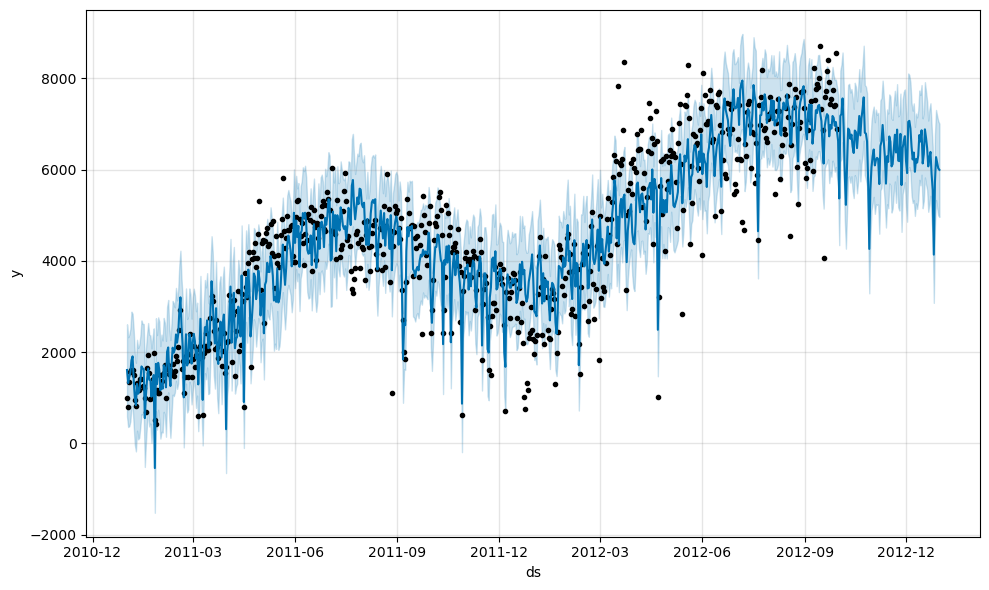

In [42]:
fig1 = prophet.plot(forecast)

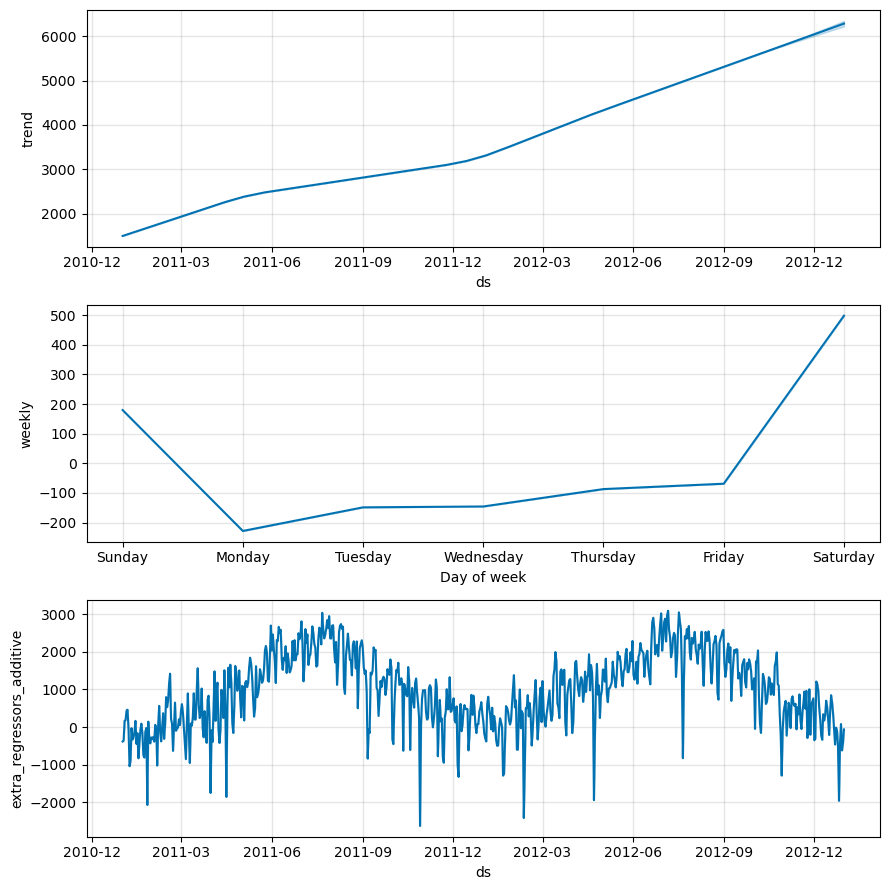

In [43]:
fig2 = prophet.plot_components(forecast)

---
---
## Evaluating Model
---

In [44]:
date = forecast[['ds', 'yhat']].copy()
date['cnt'] = df_drop['cnt'].copy()
date

,ds,yhat,cnt
0,2011-01-01,1609.007733,985
1,2011-01-02,1322.474364,801
2,2011-01-03,1450.130673,1349
3,2011-01-04,1553.927377,1562
4,2011-01-05,1820.471629,1600
...,...,...,...
726,2012-12-27,5718.110678,2114
727,2012-12-28,6271.694548,3095
728,2012-12-29,6146.159528,1341
729,2012-12-30,6025.972965,1796


In [45]:
date['residual'] = date['cnt'] - date['yhat']
date

,ds,yhat,cnt,residual
0,2011-01-01,1609.007733,985,-624.007733
1,2011-01-02,1322.474364,801,-521.474364
2,2011-01-03,1450.130673,1349,-101.130673
3,2011-01-04,1553.927377,1562,8.072623
4,2011-01-05,1820.471629,1600,-220.471629
...,...,...,...,...
726,2012-12-27,5718.110678,2114,-3604.110678
727,2012-12-28,6271.694548,3095,-3176.694548
728,2012-12-29,6146.159528,1341,-4805.159528
729,2012-12-30,6025.972965,1796,-4229.972965


In [46]:
date.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   ds        731 non-null    datetime64[ns]
 1   yhat      731 non-null    float64       
 2   cnt       731 non-null    int64         
 3   residual  731 non-null    float64       
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 23.0 KB


In [71]:
# Evaluate model performance

rmse = np.sqrt(mean_squared_error(date[date['ds']>='2011-10-01']['cnt'], date[date['ds']>='2011-10-01']['yhat']))
mae = mean_absolute_error(date[date['ds']>='2011-10-01']['cnt'], date[date['ds']>='2011-10-01']['yhat'])
mape = mean_absolute_percentage_error(date[date['ds']>='2011-10-01']['cnt'], date[date['ds']>='2011-10-01']['yhat'])

print(f'RMSE: {rmse}\n')
print(f'MAE: {mae}\n')
print(f'MAPE: {mape}')

RMSE: 1182.1992721851584

MAE: 829.4048643387848

MAPE: 0.6844948542924819


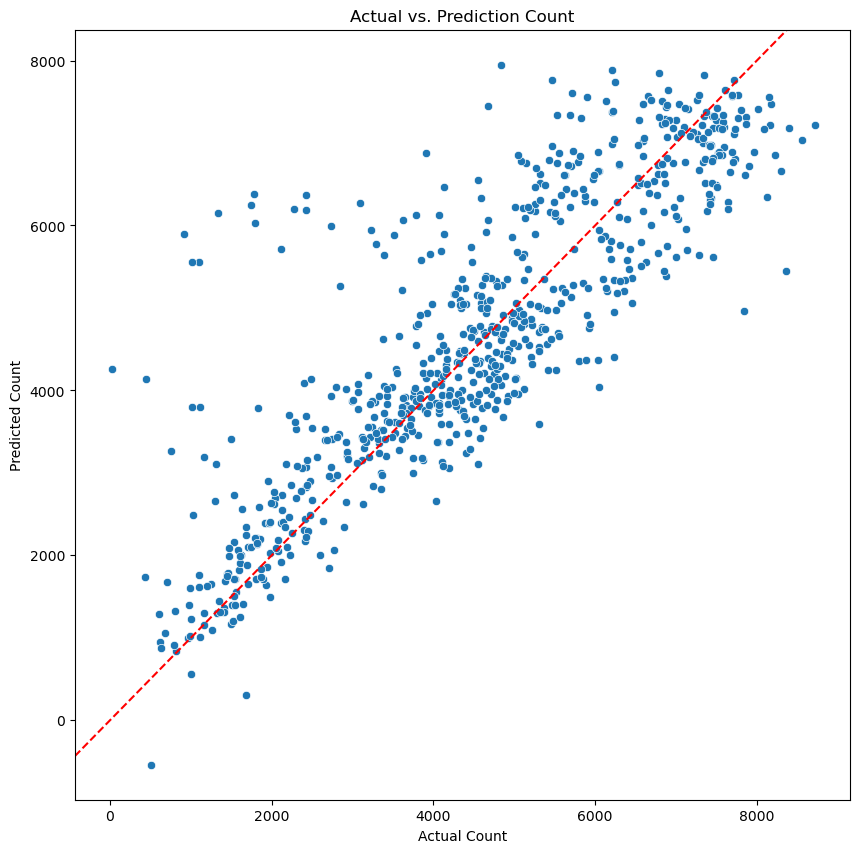

In [48]:
plt.figure(figsize=(10, 10))
sns.scatterplot(x=date['cnt'], y=date['yhat']).set(title='Actual vs. Prediction Count', 
                                               xlabel='Actual Count', 
                                               ylabel='Predicted Count')
plt.axline((0,0),slope=1, color='red', linestyle='--')
plt.show()

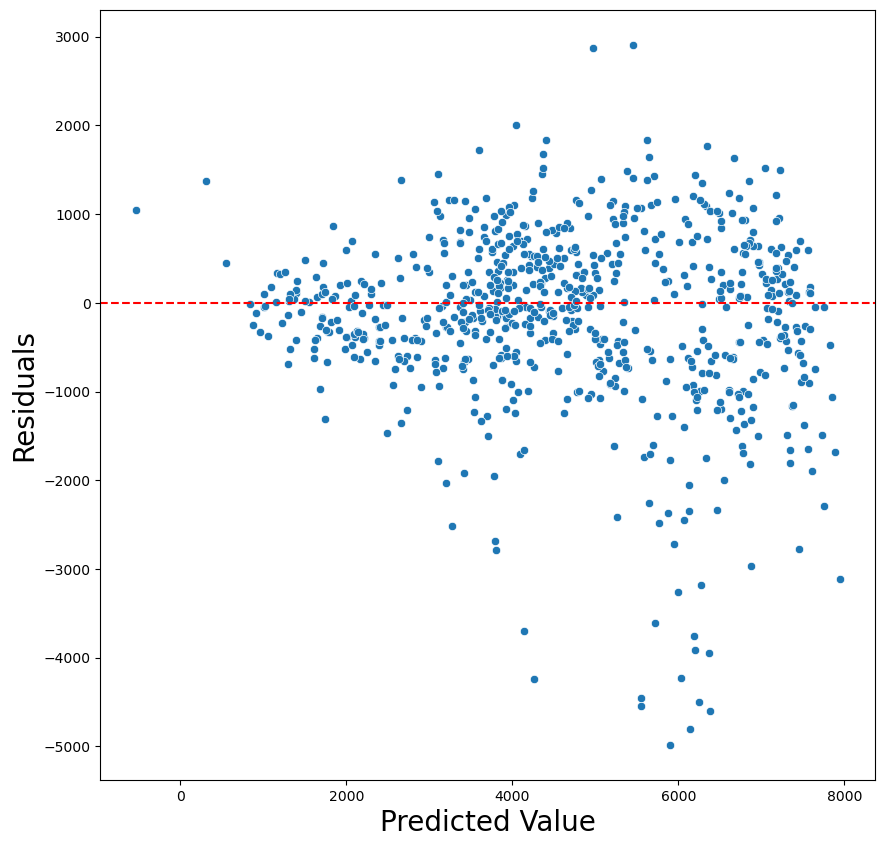

In [49]:
plt.figure(figsize=(10,10))
sns.scatterplot(x = date['yhat'], y = date['residual'])
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Value', fontsize = 20)
plt.ylabel('Residuals', fontsize = 20)
plt.show()

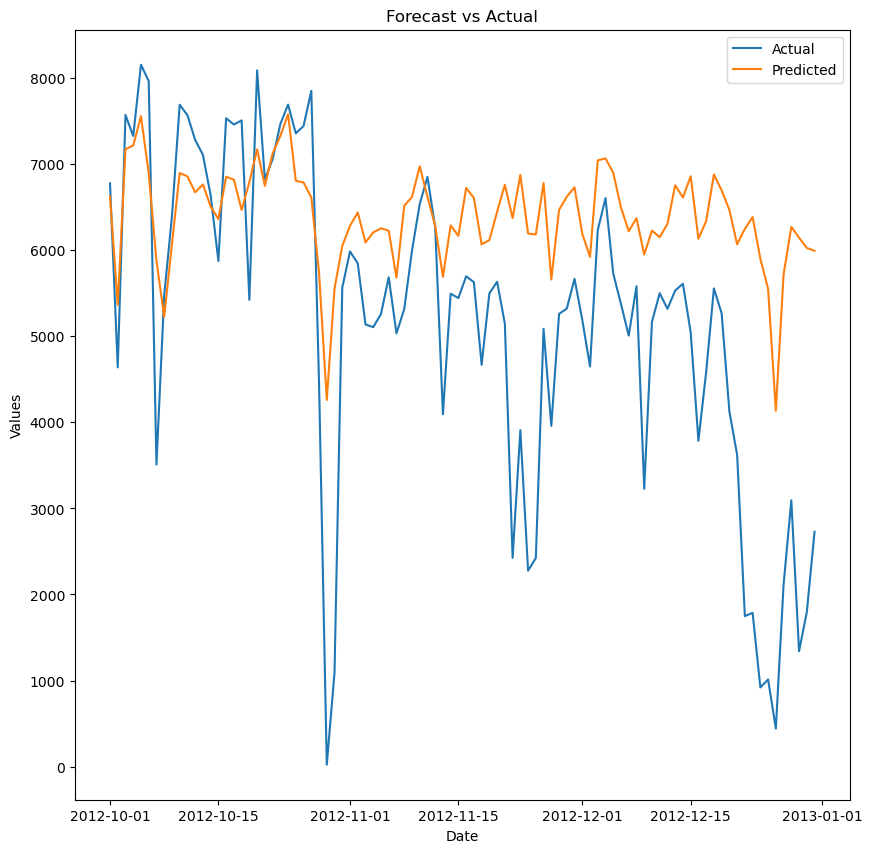

In [50]:
date['actual'] = transformed_data['y'].copy()

plt.figure(figsize=(10,10))
plt.plot(date[date['ds']>='2012-10-01']['ds'], date[date['ds']>='2012-10-01']['actual'], label= 'Actual')
plt.plot(date[date['ds']>='2012-10-01']['ds'], date[date['ds']>='2012-10-01']['yhat'], label= 'Predicted')
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()


---
---

# Machine Learning Model - Using ARIMAX
---

## Searching best ARIMA
---

In [51]:
import pmdarima as pmd
from statsmodels.tsa.arima.model import ARIMA

arima_model = pmd.auto_arima(transformed_data['y'], start_p=1, start_q=1, trace=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=12051.878, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=12252.265, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=12189.627, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=12112.006, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=12250.270, Time=0.02 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=12052.925, Time=0.81 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=12053.607, Time=0.35 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=12057.516, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=12158.388, Time=0.13 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=12056.106, Time=0.35 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=12050.020, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=12110.027, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=12187.633, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=12051.049, Time=0.34 sec
 ARIMA(1,1,2)(0,0,0

---
---
## Build ARIMA 1,1,1 Model
---

In [52]:
data_train.columns

Index(['ds', 'OH_encode__weathersit_1', 'OH_encode__weathersit_2',
       'OH_encode__weathersit_3', 'impute__hum', 'remainder__workingday',
       'remainder__temp', 'remainder__windspeed', 'y'],
      dtype='object')

In [53]:
# Splitting the data
train_data = data_train.copy()
test_data = data_test.copy()
train_data.set_index('ds', inplace=True)
test_data.set_index('ds', inplace=True)


train_X = train_data.drop(columns=['y']).copy().apply(pd.to_numeric)
train_y = train_data['y'].copy().apply(pd.to_numeric)

test_X = test_data.drop(columns=['y']).copy().apply(pd.to_numeric)
test_y = test_data['y'].copy().apply(pd.to_numeric)

In [54]:
# Fit ARIMAX model

arima = ARIMA(train_y, exog=train_X, order=(1,1,1))
arima_fit = arima.fit()

# Print model summary
print(arima_fit.summary())

c:\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  639
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -5053.664
Date:                Wed, 18 Sep 2024   AIC                          10127.328
Time:                        12:17:06   BIC                          10171.912
Sample:                    01-01-2011   HQIC                         10144.636
                         - 09-30-2012                                         
Covariance Type:                  opg                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
OH_encode__weathersit_1   523.1561   9062.513      0.058      0.954   -1.72e+04    1.83e+04
OH_encode__weathersit_2   232.1061   9064.499      0.026      0.980   -1.75e+04     1.8e+04


In [55]:
# Forecast using test data

predictions = arima_fit.forecast(steps=len(test_y), exog=test_X)

---
---
## Evaluating ARIMA Model
---

In [56]:
# Evaluate model performance

rmse = np.sqrt(mean_squared_error(test_y, predictions))
mae = mean_absolute_error(test_y, predictions)
mape = mean_absolute_percentage_error(test_y, predictions)

print(f'RMSE: {rmse}\n')
print(f'MAE: {mae}\n')
print(f'MAPE: {mape}')

RMSE: 1820.1350870120662

MAE: 1316.110898520779

MAPE: 2.762473544023679


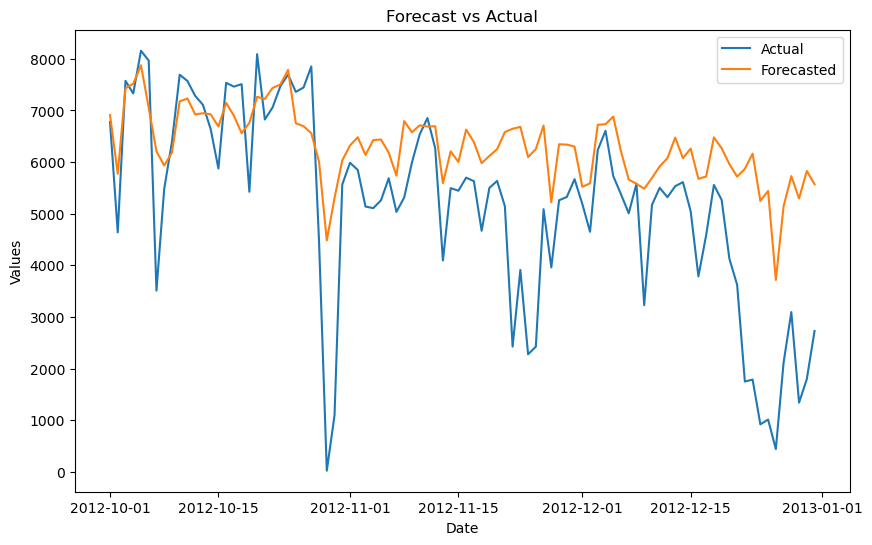

In [57]:
plt.figure(figsize=(10, 6))
plt.plot(test_y.index, test_y, label='Actual')
plt.plot(test_y.index, predictions, label='Forecasted')
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()

---
---
# Machine Learning Model - Using Vector Auto Regression
---

In [58]:
import statsmodels.api as sm
from statsmodels.tsa.api import VAR

---
---
## Preparing the Data
---

In [59]:
# Checking stationarity when d=0

from statsmodels.tsa.api import adfuller

adf_0 = adfuller(transformed_data['y'])
print(adf)

alpha = 0.05
if adf_0[1] <= alpha:
    print('Reject null hypothesis, The data is stationary')
else:
    print('Failed to reject null hypothesis, The data is not stationary')

adf_1 = adfuller(transformed_data['y'].diff().dropna())
print(adf)

alpha = 0.05
if adf_1[1] <= alpha:
    print('Reject null hypothesis, The data is stationary')
else:
    print('Failed to reject null hypothesis, The data is not stationary')

(-1.8774481444374298, 0.34274344033921944, 13, 717, {'1%': -3.439503230053971, '5%': -2.8655794463678346, '10%': -2.5689210707289982}, 11740.390931163352)
Failed to reject null hypothesis, The data is not stationary
(-1.8774481444374298, 0.34274344033921944, 13, 717, {'1%': -3.439503230053971, '5%': -2.8655794463678346, '10%': -2.5689210707289982}, 11740.390931163352)
Reject null hypothesis, The data is stationary


In [60]:
# Preparing differencing 1

dif = transformed_data.copy()
dif['diff_hum'] = dif['impute__hum'].diff()
dif['diff_temp'] = dif['remainder__temp'].diff()
dif['diff_windspeed'] = dif['remainder__windspeed'].diff()
dif['diff_y'] = dif['y'].diff()
dif.set_index('ds', inplace=True)
dif

,OH_encode__weathersit_1,OH_encode__weathersit_2,OH_encode__weathersit_3,impute__hum,remainder__workingday,remainder__temp,remainder__windspeed,y,diff_hum,diff_temp,diff_windspeed,diff_y
ds,,,,,,,,,,,,
2011-01-01,0.0,1.0,0.0,0.805833,0,0.344167,0.160446,985,NaN,NaN,NaN,NaN
2011-01-02,0.0,1.0,0.0,0.696087,0,0.363478,0.248539,801,-0.109746,0.019311,0.088093,-184
2011-01-03,1.0,0.0,0.0,0.437273,1,0.196364,0.248309,1349,-0.258814,-0.167114,-0.00023,548
2011-01-04,1.0,0.0,0.0,0.590435,1,0.2,0.160296,1562,0.153162,0.003636,-0.088013,213
2011-01-05,1.0,0.0,0.0,0.436957,1,0.226957,0.1869,1600,-0.153478,0.026957,0.026604,38
...,...,...,...,...,...,...,...,...,...,...,...,...
2012-12-27,0.0,1.0,0.0,0.652917,1,0.254167,0.350133,2114,-0.170416,0.010834,0.033587,1673
2012-12-28,0.0,1.0,0.0,0.59,1,0.253333,0.155471,3095,-0.062917,-0.000834,-0.194662,981
2012-12-29,0.0,1.0,0.0,0.752917,0,0.253333,0.124383,1341,0.162917,0.0,-0.031088,-1754


In [61]:
# Splitting the data

dif_train = dif[:'2012-09-30'].copy().apply(pd.to_numeric)
dif_test = dif['2012-10-01':].copy().apply(pd.to_numeric)

dif_train.dropna(how='any', inplace=True)

---
---
## Building Model with VAR
---

In [62]:
dif_train.columns

Index(['OH_encode__weathersit_1', 'OH_encode__weathersit_2',
       'OH_encode__weathersit_3', 'impute__hum', 'remainder__workingday',
       'remainder__temp', 'remainder__windspeed', 'y', 'diff_hum', 'diff_temp',
       'diff_windspeed', 'diff_y'],
      dtype='object')

In [63]:
# Initialize VAR model
var_1 = VAR(endog=dif_train[['diff_hum', 'diff_temp', 'diff_windspeed', 'diff_y']], exog=dif_train[['OH_encode__weathersit_1', 'OH_encode__weathersit_2', 'OH_encode__weathersit_3', 'remainder__workingday']])

c:\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


In [64]:
# Fitting the model

var_1_fit = var_1.fit()

In [65]:
# Make prediction on validation

forecast_VAR = var_1_fit.forecast(dif_train[['diff_hum', 'diff_temp', 'diff_windspeed', 'diff_y']].values, exog_future=dif_test[['OH_encode__weathersit_1', 'OH_encode__weathersit_2', 'OH_encode__weathersit_3', 'remainder__workingday']], steps=len(dif_test))

In [66]:
# Converting Predictions to DataFrame

pred_VAR = pd.DataFrame(forecast_VAR)
pred_VAR.index=dif_test.index
pred_VAR.columns = ['predicted_hum', 'predicted_temp', 'predicted_windspeed', 'predicted_y']
pred_VAR

,predicted_hum,predicted_temp,predicted_windspeed,predicted_y
ds,,,,
2012-10-01,0.102487,0.003710,0.031458,345.713860
2012-10-02,0.115207,-0.025552,0.044813,-1801.871895
2012-10-03,0.020329,-0.018761,-0.008968,428.608688
2012-10-04,0.062001,-0.000161,-0.003170,-319.214096
2012-10-05,-0.066554,0.012996,0.005154,566.308704
...,...,...,...,...
2012-12-27,0.012026,-0.014587,-0.007593,414.021910
2012-12-28,0.064916,-0.001315,-0.003337,-335.342323
2012-12-29,0.068458,-0.008620,0.015365,-427.734064


---
---
## Evaluating VAR Model
---

In [67]:
test_dif_y = dif_test['y']
pred_dif_y = pred_VAR['predicted_y']

In [68]:
# Evaluate model performance

rmse = np.sqrt(mean_squared_error(test_dif_y, pred_dif_y))
mae = mean_absolute_error(test_dif_y, pred_dif_y)
mape = mean_absolute_percentage_error(test_dif_y, pred_dif_y)

print(f'RMSE: {rmse}\n')
print(f'MAE: {mae}\n')
print(f'MAPE: {mape}')

RMSE: 5516.864435443188

MAE: 5213.588261836321

MAPE: 1.8436735657054053


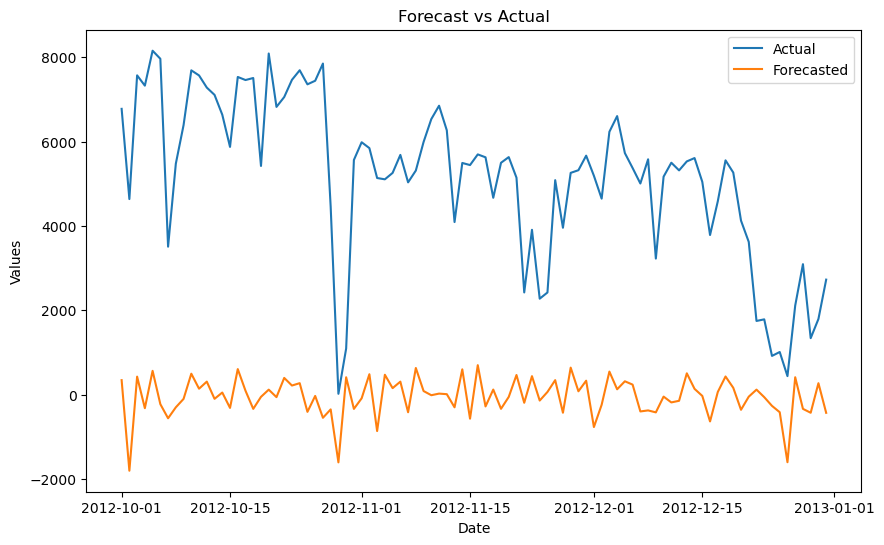

In [69]:
plt.figure(figsize=(10, 6))
plt.plot(dif_test.index, test_dif_y, label='Actual')
plt.plot(dif_test.index, pred_dif_y, label='Forecasted')
plt.title('Forecast vs Actual')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.show()

---
---
# Summary
---

After comparing test results, the model used for this case is Prophet, because of these reasons:
* While the MAPE is quite big (68%), the model could forecast well up to a major fall happened (on October 28th, 2011).
* The output metrics are better compared to using ARIMAX and VAR, and the forecasting graph were nearer compared to using Linear Regression.

---
---
# Saving Model
---

In [73]:
from prophet.serialize import model_to_json, model_from_json

with open('serialized_model.json', 'w') as fout:
    fout.write(model_to_json(prophet))  # Save model

with open('serialized_model.json', 'r') as fin:
    m = model_from_json(fin.read())  # Load model